In [1]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import sklearn

import seaborn as sns
import os

from sklearn.metrics import mean_squared_error, r2_score 
from sklearn.model_selection import train_test_split 
from sklearn import linear_model, preprocessing 

In [97]:
dfe = pd.read_csv('Data.csv')
df = dfe[dfe['genre'] == 'Rap']

In [4]:
df.describe()

,Unnamed: 0,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,...,duration_ms_zscore_zscore_zscore,energy_zscore_zscore_zscore,instrumentalness_zscore_zscore_zscore,liveness_zscore_zscore_zscore,loudness_zscore_zscore_zscore,speechiness_zscore_zscore_zscore,tempo_zscore_zscore_zscore,valence_zscore_zscore_zscore,lognorm_duration_zscore_zscore_zscore,Count_zscore_zscore_zscore
count,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,...,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000
mean,93046.204831,60.533795,0.168080,0.697244,219853.858102,0.650520,0.009317,0.198939,-6.669916,0.188186,...,-0.148769,0.288395,-0.467332,-0.094061,0.486282,0.350860,0.129458,0.049376,-0.083696,-0.026787
std,13042.090536,8.177226,0.189780,0.141120,57890.478727,0.156686,0.065828,0.152349,2.450655,0.133128,...,0.472625,0.584115,0.215424,0.752218,0.396083,0.688921,0.958097,0.822791,0.664277,0.522567
min,68784.000000,14.000000,0.000007,0.179000,39640.000000,0.066800,0.000000,0.020800,-22.589000,0.022900,...,-1.620057,-1.887676,-0.497823,-0.973614,-2.086616,-0.504473,-2.515717,-1.576941,-4.312903,-0.599141
25%,96844.750000,55.000000,0.025700,0.604000,183790.000000,0.542000,0.000000,0.102750,-7.970750,0.070100,...,-0.443199,-0.116159,-0.497823,-0.568989,0.276036,-0.260219,-0.714570,-0.584961,-0.449536,-0.417935
50%,99152.500000,59.000000,0.096000,0.713000,214966.000000,0.649500,0.000000,0.135000,-6.347000,0.161000,...,-0.188674,0.284594,-0.497823,-0.409755,0.538472,0.210175,0.136708,0.011227,-0.054912,-0.162115
75%,101460.250000,65.000000,0.248250,0.802000,250687.000000,0.762000,0.000010,0.258000,-5.014750,0.279000,...,0.102957,0.703987,-0.497790,0.197553,0.753795,0.820809,0.806918,0.661264,0.332256,0.226944
max,103768.000000,99.000000,0.965000,0.980000,760973.000000,0.997000,0.951000,0.989000,0.496000,0.922000,...,4.268995,1.580053,2.614335,3.806841,1.644462,4.148244,3.209328,2.034419,3.128853,1.937741


In [103]:
cols = df.columns

allpop = dfe[dfe.popular == 'popular']
pop = df[df.popular == 'popular']
nonpop = df[df.popular == 'not-popular']
print(df.corr())
print(pop.corr())
print(nonpop.corr())

                                       Unnamed: 0  popularity  acousticness  \
Unnamed: 0                               1.000000   -0.782580     -0.029408   
popularity                              -0.782580    1.000000      0.008856   
acousticness                            -0.029408    0.008856      1.000000   
danceability                            -0.090576    0.060827     -0.044776   
duration_ms                              0.009143   -0.018356     -0.035848   
energy                                   0.100164   -0.041114     -0.314802   
instrumentalness                         0.039919   -0.007325      0.071091   
liveness                                 0.042990   -0.058562     -0.041794   
loudness                                -0.008949    0.068479     -0.283500   
speechiness                             -0.002022   -0.081633      0.102392   
tempo                                   -0.022858    0.017122     -0.088897   
valence                                  0.024061   

AxesSubplot(0.125,0.125;0.62x0.755)


/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:1350: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.tight_layout(pad=layout_pad)


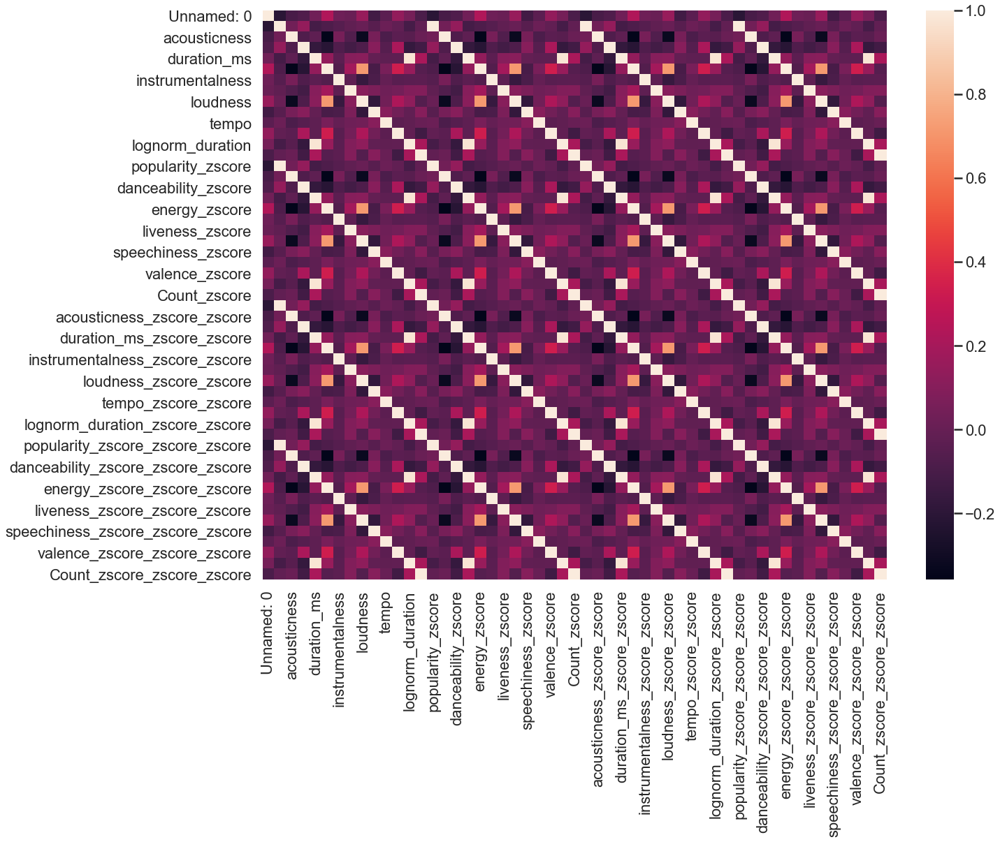

In [49]:
plt.subplots(figsize=(20,15))

m = sns.heatmap(pop.corr())
print(m)
n = sns.pairplot(data=pop)
print(n)


In [117]:
#plt.subplots(figsize=(20,15))

#m = sns.heatmap(nonpop.corr())
#print(m)
#p = sns.pairplot(data=nonpop)
#print(p)

<ErrorbarContainer object of 3 artists>

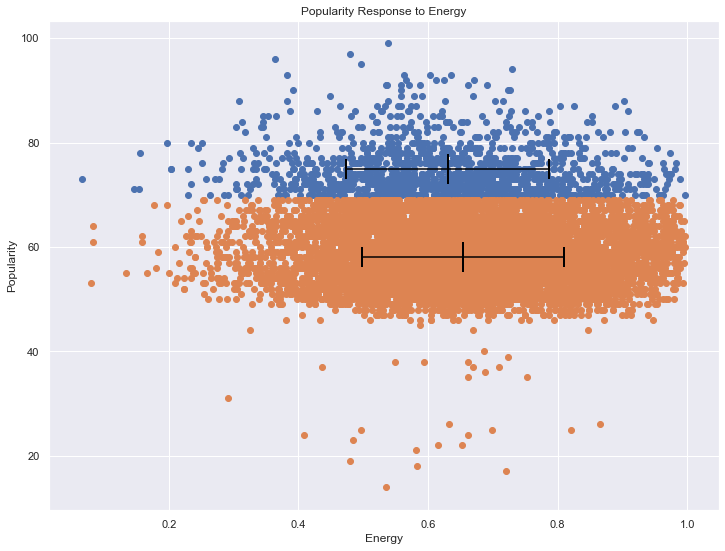

In [72]:
plt.scatter(pop.energy, pop.popularity)
plt.scatter(nonpop.energy, nonpop.popularity)
plt.xlabel("Energy")
plt.ylabel("Popularity")
plt.title("Popularity Response to Energy")

plt.errorbar(np.mean(pop.energy),np.mean(pop.popularity),xerr=np.std(pop.energy),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.energy),np.mean(nonpop.popularity),xerr=np.std(nonpop.energy),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

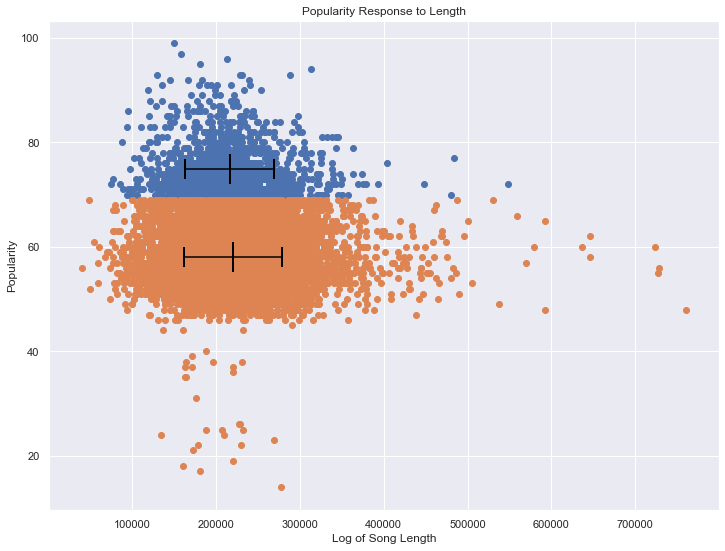

In [83]:
plt.scatter(pop.duration_ms, pop.popularity)
plt.scatter(nonpop.duration_ms, nonpop.popularity)
plt.xlabel("Log of Song Length")
plt.ylabel("Popularity")
plt.title("Popularity Response to Length")

plt.errorbar(np.mean(pop.duration_ms),np.mean(pop.popularity),xerr=np.std(pop.duration_ms),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.duration_ms),np.mean(nonpop.popularity),xerr=np.std(nonpop.duration_ms),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

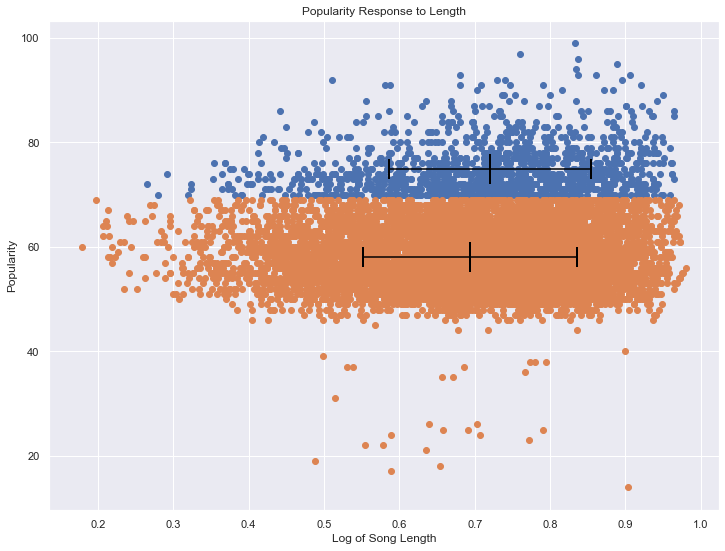

In [80]:
plt.scatter(pop.danceability, pop.popularity)
plt.scatter(nonpop.danceability, nonpop.popularity)
plt.xlabel("Danceability")
plt.ylabel("Popularity")
plt.title("Popularity Response to Danceability")

plt.errorbar(np.mean(pop.danceability),np.mean(pop.popularity),xerr=np.std(pop.danceability),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.danceability),np.mean(nonpop.popularity),xerr=np.std(nonpop.danceability),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

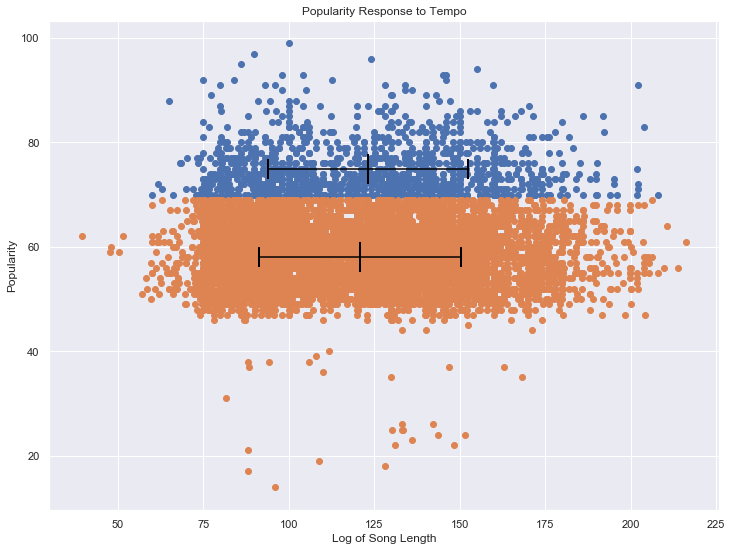

In [116]:
plt.scatter(pop.Count, pop.popularity)
plt.scatter(nonpop.Count, nonpop.popularity)
plt.xlabel("Log of Song Length")
plt.ylabel("Popularity")
plt.title("Popularity Response to Log Length")

plt.errorbar(np.mean(pop.Count),np.mean(pop.popularity),xerr=np.std(pop.Count),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.Count),np.mean(nonpop.popularity),xerr=np.std(nonpop.Count),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

In [43]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

                                       Unnamed: 0  popularity  acousticness  \
Unnamed: 0                               1.000000   -0.782580     -0.029408   
popularity                              -0.782580    1.000000      0.008856   
acousticness                            -0.029408    0.008856      1.000000   
danceability                            -0.090576    0.060827     -0.044776   
duration_ms                              0.009143   -0.018356     -0.035848   
energy                                   0.100164   -0.041114     -0.314802   
instrumentalness                         0.039919   -0.007325      0.071091   
liveness                                 0.042990   -0.058562     -0.041794   
loudness                                -0.008949    0.068479     -0.283500   
speechiness                             -0.002022   -0.081633      0.102392   
tempo                                   -0.022858    0.017122     -0.088897   
valence                                  0.024061   

AxesSubplot(0.125,0.125;0.62x0.755)


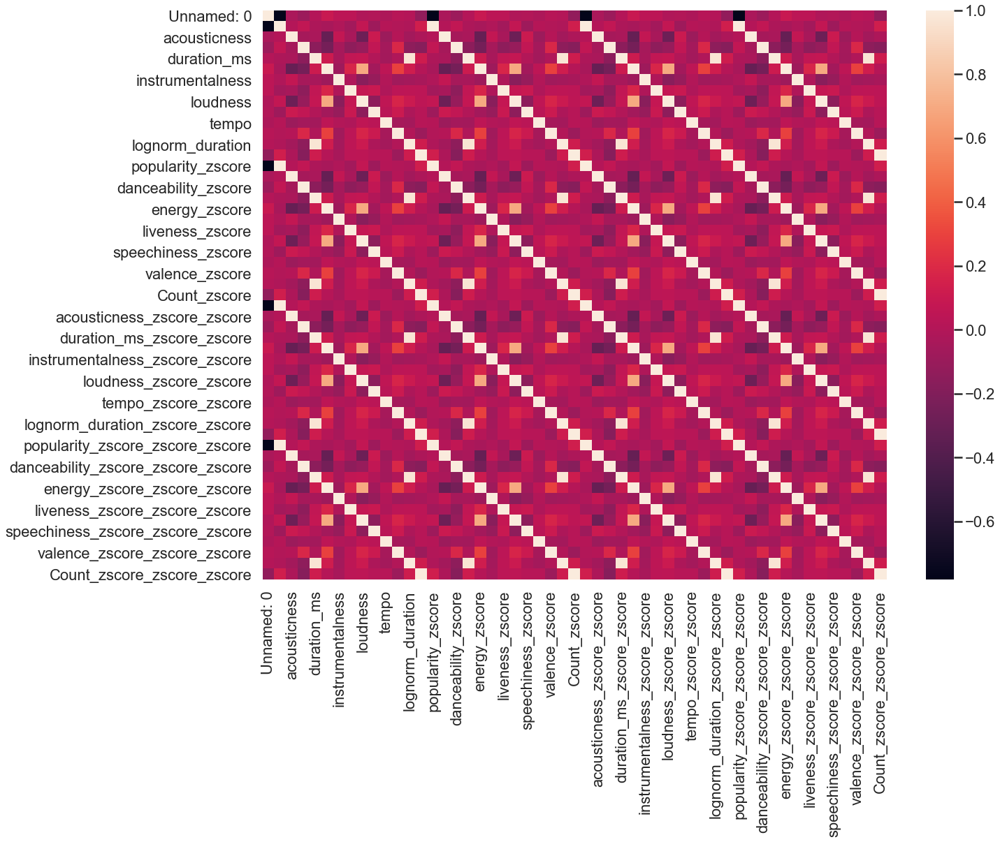

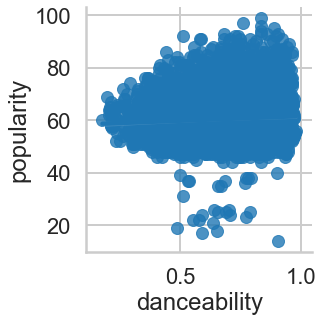

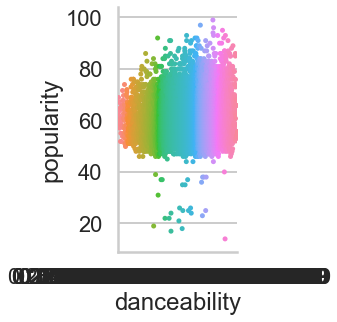

In [44]:
plt.subplots(figsize=(20,15))
print(df.corr())
m = sns.heatmap(df.corr())
print(m)
n = sns.lmplot(x='danceability',y='popularity',data=pop)
print(n)
p = sns.lmplot(x='danceability',y='popularity',data=nonpop)
print(p)


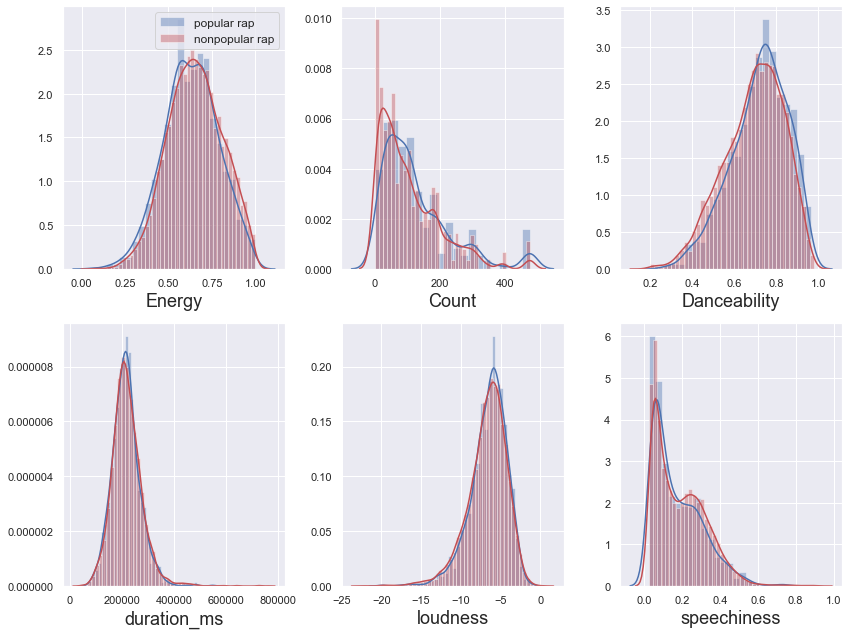

In [113]:

plt.subplot(231)
sns.distplot(pop.energy, label='popular rap')
sns.distplot(nonpop.energy, color='r', label='nonpopular rap')
plt.xlabel('Energy', fontsize=18)
plt.legend(fontsize=12)

plt.subplot(232)
sns.distplot(pop.Count)
sns.distplot(nonpop.Count, color='r')
plt.xlabel('Count', fontsize=18)

plt.subplot(233)
sns.distplot(pop.danceability)
sns.distplot(nonpop.danceability, color='r')
plt.xlabel('Danceability', fontsize=18)

plt.subplot(234)
sns.distplot(pop.duration_ms)
sns.distplot(nonpop.duration_ms, color='r')
plt.xlabel('duration_ms', fontsize=18)

plt.subplot(235)
sns.distplot(pop.loudness)
sns.distplot(nonpop.loudness, color='r')
plt.xlabel('loudness', fontsize=18)

plt.subplot(236)
sns.distplot(pop.speechiness)
sns.distplot(nonpop.speechiness, color='r')
plt.xlabel('speechiness', fontsize=18)

plt.tight_layout()
plt.show()


/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


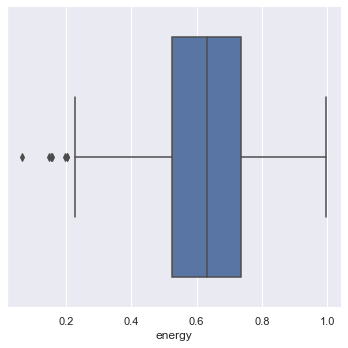

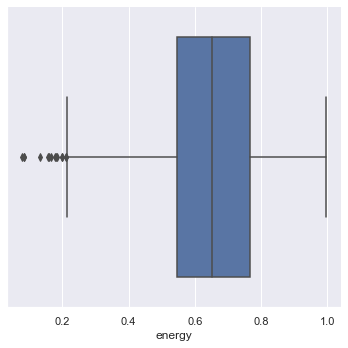

In [94]:
sns.factorplot(x='energy', data=pop, kind='box')


sns.factorplot(x='energy', data=nonpop, kind='box')
plt.show()

/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


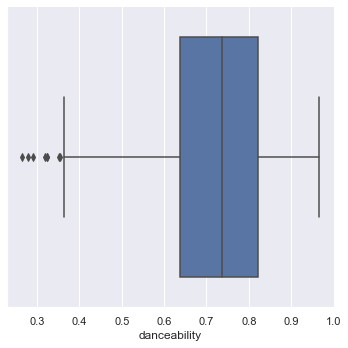

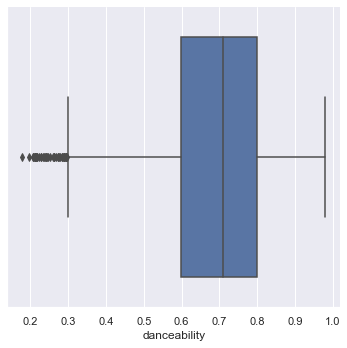

In [95]:
sns.factorplot(x='danceability', data=pop, kind='box')
sns.factorplot(x='danceability', data=nonpop, kind='box')
plt.show()

/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


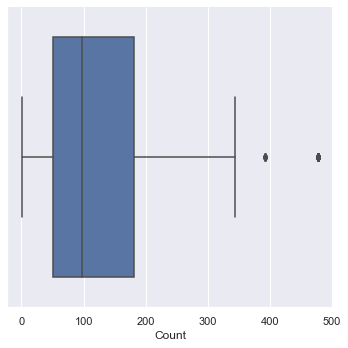

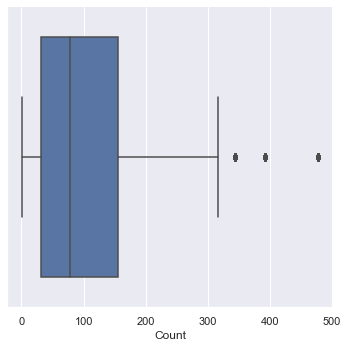

In [96]:
sns.factorplot(x='Count', data=pop, kind='box')


sns.factorplot(x='Count', data=nonpop, kind='box')
plt.show()

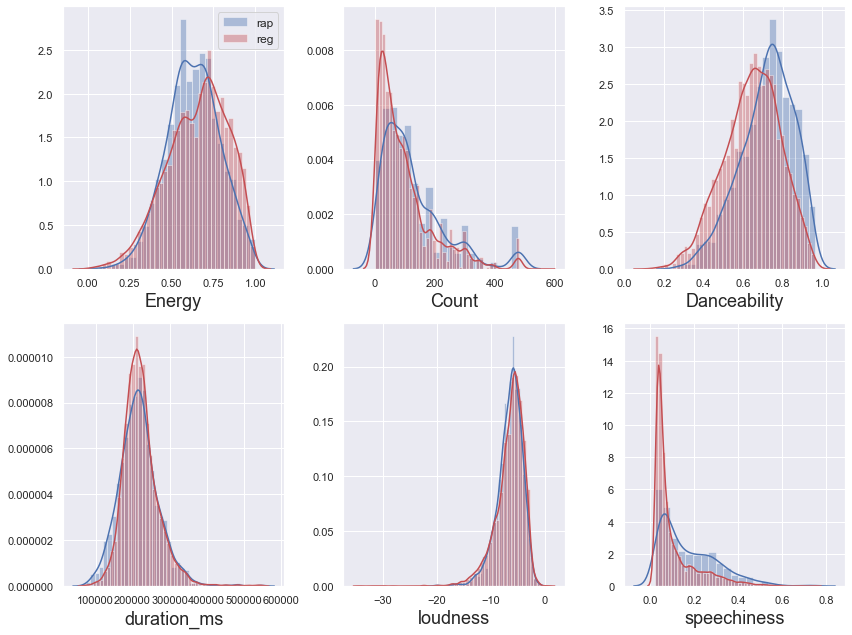

In [114]:


plt.subplot(231)
sns.distplot(pop.energy, label='rap')
sns.distplot(allpop.energy, color='r', label='reg')
plt.xlabel('Energy', fontsize=18)
plt.legend(fontsize=12)

plt.subplot(232)
sns.distplot(pop.Count)
sns.distplot(allpop.Count, color='r')
plt.xlabel('Count', fontsize=18)

plt.subplot(233)
sns.distplot(pop.danceability)
sns.distplot(allpop.danceability, color='r')
plt.xlabel('Danceability', fontsize=18)

plt.subplot(234)
sns.distplot(pop.duration_ms)
sns.distplot(allpop.duration_ms, color='r')
plt.xlabel('duration_ms', fontsize=18)

plt.subplot(235)
sns.distplot(pop.loudness)
sns.distplot(allpop.loudness, color='r')
plt.xlabel('loudness', fontsize=18)

plt.subplot(236)
sns.distplot(pop.speechiness)
sns.distplot(allpop.speechiness, color='r')
plt.xlabel('speechiness', fontsize=18)



plt.tight_layout()
plt.show()


In [ ]:
)